# Testing on invivo data

In [1]:
from os.path import isfile, join
import importlib
from IPython.display import clear_output
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sc
import pickle
import sys
depth = '../'
for i in range(7):
    sys.path.append(i*depth)
from MRF.Training_parameters import *
from MRF.BaseModel import *
from MRF.Projection import *
from MRF.models import *
from MRF.result_analysis_common import *
import MRF
from MRF.Offline import Network, Data_class, Performances
clear_output()

import torch
PD = 1
import matplotlib.pyplot as plt
from scipy.io import loadmat
root = 6*depth

## 1) Function to compute estimations and to show results

In [8]:
def disp_settings(model_name):
    fullname=root+'settings_files_offline/settings_'+model_name+'.pkl'
    with open(fullname,'rb') as f:
        sett=pickle.load(f)
        for key, val in sett.items():
            print('\033[1m'+key+'\033[0m')
            print(val)
            print('\n')

## invivo estimation
def invivo_parameter_estimation(model,model_name, fingerprints):
    parametersm0s = []
    parameterst1 = []
    parameterst2 = []

    with open(root+'settings_files_offline/settings_' + model_name + '.pkl', 'rb') as f:
        settings = pickle.load(f)
        settings['namepca'] = root+'paper_data/basis_for_compress.mat'
        net = torch.load(join(root+'save_networks_offline', 'network_' + model_name), map_location='cpu')
        training_parameters = Training_parameters(settings['batch_size'], 1, settings['nb_epochs'], settings['params'],
                                                  settings['normalization'], settings['complex'])
        projection = Projection(settings['start_by_projection'], settings['dimension_projection'],
                                settings['initialization'], settings['normalization'], settings['namepca'], settings['complex'])
        data_class = Data_class(training_parameters, settings['noise_type'], settings['noise_level'],
                                settings['minPD'], settings['maxPD'], settings['nb_files'], settings['path_files'])
        validation_settings = {'validation': settings['validation'],
                               'small_validation_size': settings['small_validation_size'],
                               'validation_size': settings['validation_size']}
        netw = model.model(projection=projection, nb_params=len(settings['params']))
        device = torch.device('cpu')
        netw.load_state_dict(net['NN'])
        netw.to(device)

        netw.eval()

    with torch.no_grad():
        fingerprints_tmpt = torch.tensor(fingerprints, dtype=torch.float).to(device)
        prms = netw(fingerprints_tmpt)
        prms = np.array(prms.cpu())
        pars = prms
        for ii, para in enumerate(settings['params']):
            if settings['loss'][para] == 'MSE-Log':
                pars[:, ii] = 10 ** pars[:, ii]
        parametersm0s.append(np.array(pars[:, 0]))
        parameterst1.append(np.array(pars[:, 1]))
        parameterst2.append(np.array(pars[:, 2]))

    parametersm0s = np.array(parametersm0s).reshape((mrfshape[1], mrfshape[2]))
    parameterst1 = np.array(parameterst1).reshape((mrfshape[1], mrfshape[2]))
    parameterst2 = np.array(parameterst2).reshape((mrfshape[1], mrfshape[2]))
    invivo_estimation = np.concatenate((np.expand_dims(parametersm0s, axis=2), np.expand_dims(parameterst1, axis=2),
                            np.expand_dims(parameterst2, axis=2)), axis=2)

    return invivo_estimation

def invivo_parameter_estimation_epochloop(model, model_name1,model_name, fingerprints):
    parametersm0s = []
    parameterst1 = []
    parameterst2 = []

    with open(root+'settings_files_offline/settings_' + model_name1 + '.pkl', 'rb') as f:
        settings = pickle.load(f)
        net = torch.load(join(root+'save_networks_offline', 'network_' + model_name), map_location='cpu')
        training_parameters = Training_parameters(settings['batch_size'], 1, settings['nb_epochs'], settings['params'],
                                                  settings['normalization'])
        projection = Projection(settings['start_by_projection'], settings['dimension_projection'],
                                settings['initialization'], settings['normalization'], settings['namepca'])
        data_class = Data_class(training_parameters, settings['noise_type'], settings['noise_level'],
                                settings['minPD'], settings['maxPD'], settings['nb_files'], settings['path_files'])
        validation_settings = {'validation': settings['validation'],
                               'small_validation_size': settings['small_validation_size'],
                               'validation_size': settings['validation_size']}
        netw = model.model(projection=projection, nb_params=len(settings['params']))
        device = torch.device('cpu')
        netw.load_state_dict(net['NN'])
        netw.to(device)

        netw.eval()

    with torch.no_grad():
        fingerprints_tmpt = torch.tensor(fingerprints, dtype=torch.float).to(device)

        prms = netw(fingerprints_tmpt)
        prms = np.array(prms.cpu())
        pars = prms
        for ii, para in enumerate(settings['params']):
            if settings['loss'][para] == 'MSE-Log':
                pars[:, ii] = 10 ** pars[:, ii]
        parametersm0s.append(np.array(pars[:, 0]))
        parameterst1.append(np.array(pars[:, 1]))
        parameterst2.append(np.array(pars[:, 2]))

    parametersm0s = np.array(parametersm0s).reshape((mrfshape[1], mrfshape[2]))
    parameterst1 = np.array(parameterst1).reshape((mrfshape[1], mrfshape[2]))
    parameterst2 = np.array(parameterst2).reshape((mrfshape[1], mrfshape[2]))
    invivo_estimation = np.concatenate((np.expand_dims(parametersm0s, axis=2), np.expand_dims(parameterst1, axis=2),
                            np.expand_dims(parameterst2, axis=2)), axis=2)

    return invivo_estimation

def plot_invivo_slice(invivo_estimation,model_title,clorname='jet'):
    fsize=12
    fig = plt.figure(figsize=(21,7))
    ax1=plt.subplot(1, 3, 1)
    plt.imshow(invivo_estimation[:,:,0].T,cmap=clorname,vmin=0, vmax=0.25)
    plt.colorbar()
    plt.title('m0s' , fontsize=10)
    plt.ylabel('Reg7e-06', fontsize=fsize)

    ax1=plt.subplot(1, 3, 2)
    plt.imshow(invivo_estimation[:,:,1].T,cmap=clorname,vmin=0, vmax=2.5)
    plt.colorbar()
    plt.title('T1' , fontsize=10)

    ax1=plt.subplot(1, 3, 3)
    plt.imshow(invivo_estimation[:,:,2].T,cmap=clorname,vmin=0, vmax=0.11)
    plt.colorbar()
    plt.title('T2f' , fontsize=10)
    plt.suptitle(model_title)

def plot_invivo_2_slice_comparison(data_all, model_name, clorname='jet'):
    rwo = 2
    col = 3
    fsize = 12

    data = data_all[0]

    fig = plt.figure(figsize=(21, 14))
    n = 1
    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 0].T, cmap=clorname, vmin=0, vmax=0.25)
    plt.colorbar()
    plt.title('m0s', fontsize=10)
    plt.ylabel('Reg7e-06', fontsize=fsize)
    n = n + 1

    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 1].T, cmap=clorname, vmin=0, vmax=2.5)
    plt.colorbar()
    plt.title('T1', fontsize=10)
    n = n + 1

    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 2].T, cmap=clorname, vmin=0, vmax=0.11)
    plt.colorbar()
    plt.title('T2f', fontsize=10)
    plt.suptitle(model_name[0])
    n = n + 1
    ###########
    data = data_all[1]
    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 0].T, cmap=clorname, vmin=0, vmax=0.25)
    plt.colorbar()
    plt.title('m0s', fontsize=10)
    plt.ylabel('Reg7e-06', fontsize=fsize)
    n = n + 1

    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 1].T, cmap=clorname, vmin=0, vmax=2.5)
    plt.colorbar()
    plt.title('T1', fontsize=10)
    n = n + 1

    ax1 = plt.subplot(rwo, col, n)
    plt.imshow(data[:, :, 2].T, cmap=clorname, vmin=0, vmax=0.11)
    plt.colorbar()
    plt.title('T2f', fontsize=10)
    plt.suptitle(model_name[1])
    n = n + 1

## 2) Showing settings of the trained networks 

In [9]:
model_name='CRB-paper'
disp_settings(model_name)

optimizer
Adam


lr
0.01


model
CRB-paper


noise_type
Standard


noise_level
0.01


normalization
After_projection


namepca
/gpfs/data/asslaenderlab/20200917_InVivo_MT_1mm_MWI_1p7mm/20201021_nonSweeping_Recos_n_Fits_Symmetric_Basis/basis_v3.2_sweep_0_std_B0_pio2_symmetric_B1_0.9pm0.2.mat


loss
['MSE-CRB', 'MSE-CRB', 'MSE-CRB', 'MSE-CRB', 'MSE-CRB', 'MSE', 'MSE', 'MSE']


batch_size
1024


start_by_projection
True


nb_epochs
800


params
[0, 1, 2]


initialization
Fixlayer


validation_size
56320


validation
True


small_validation_size
10240


minPD
0.1


maxPD
1.0


save_name
CRB-paper


nb_files
1000


path_files
v3_uniform_b1cutoff_B0B1vary_R13_complex


dimension_projection
13


name_model
CRB-paper


complex
True




## 3) Visualizing results

Fixlayer
torch.Size([37625, 26])


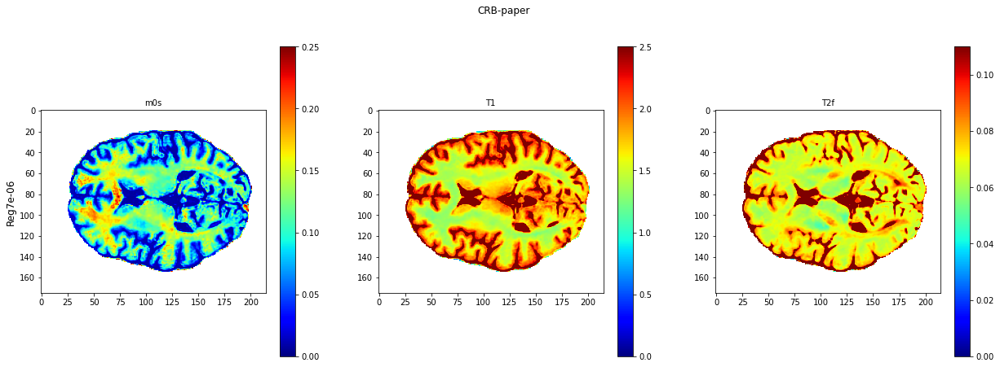

In [14]:
#select a slice to test
invivo_fingerprints = sc.io.loadmat(root+'paper_data/invivo_test_slice.mat')['x'].T
mrfshape = invivo_fingerprints.shape
invivo_fingerprints = invivo_fingerprints.reshape((-1, mrfshape[1] * mrfshape[2]))
invivo_fingerprints = invivo_fingerprints.T
model = importlib.import_module('MRF.models.CRB-paper')
model_name_list = ['CRB-paper']
model_title_list = ['CRB-paper']
for i in range(len(model_name_list)):
    model_name=model_name_list[i]
    invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
    plot_invivo_slice(invivo_result_slice,model_title_list[i])

## 4) Other examples of results on different slices and/or different networks

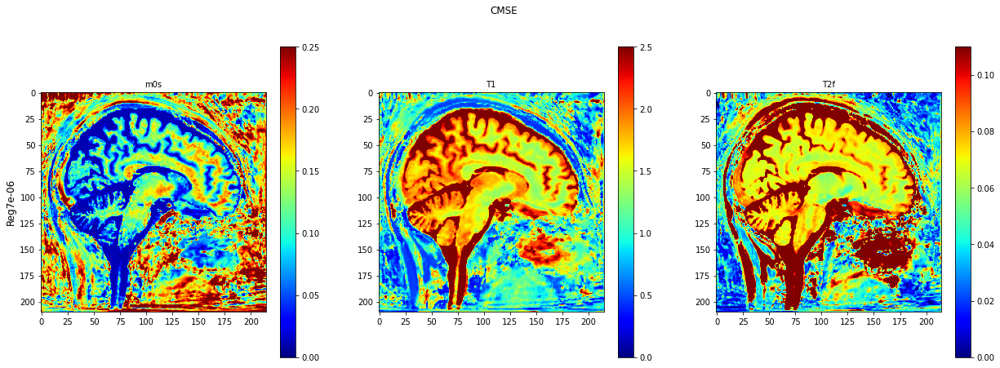

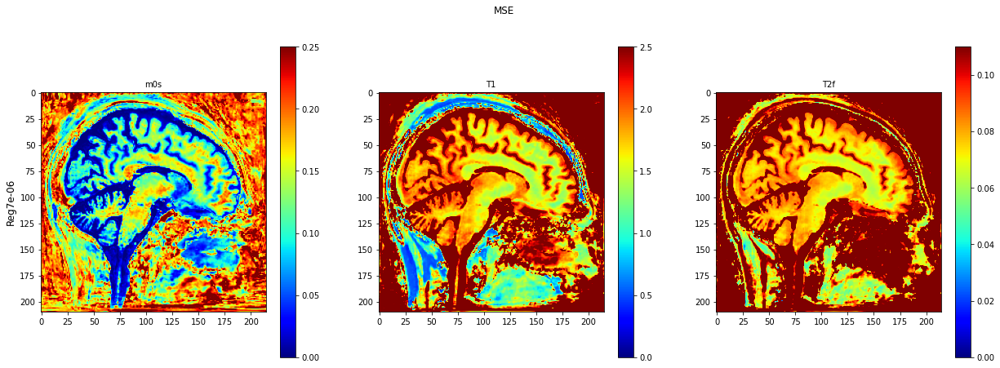

In [38]:
# Here, we use the function `plot_invivo_2_slice_comparison` to compare the results
# on invivo data for the network trained with the CRB loss and a network trained 
# with the usual MSE loss.

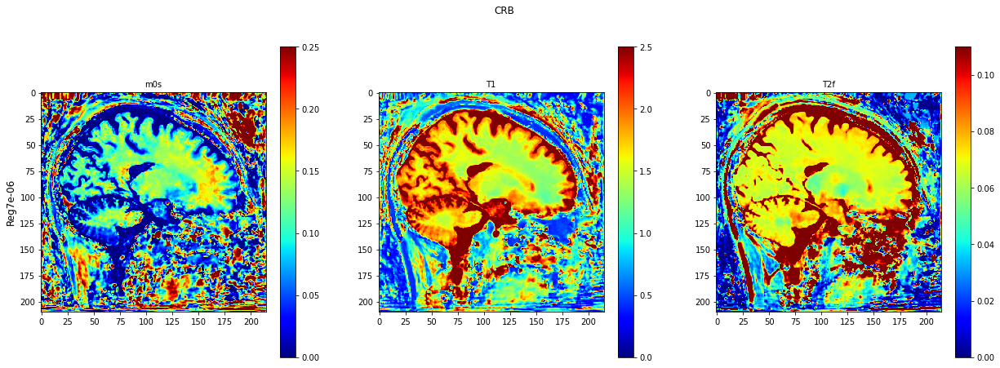

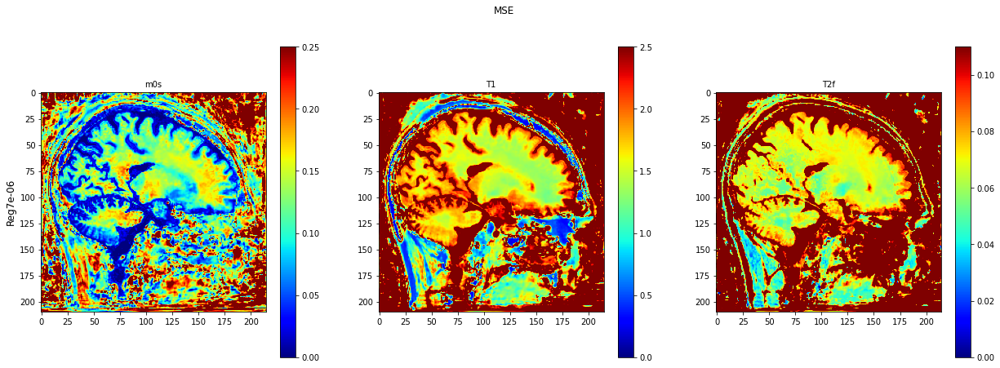

In [15]:
########################################### MSE/CRB invivo lr=0.01####################################################
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')

########## MSE/CRB invivo lr=0.001 #################
model_name ='d0324_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001'
invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
plot_invivo_slice(invivo_result_slice,'CRB')

########## MSE invivo lr=0.001 #####################
model_name ='d0324_MSE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3'
invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
plot_invivo_slice(invivo_result_slice,'MSE')

## different check 

In [7]:
def invivo_parameter_estimation_check(model,model_name, fingerprints):
    parametersm0s = []
    parameterst1 = []
    parameterst2 = []

    with open('../settings_files_offline/settings_' + model_name[8:] + '.pkl', 'rb') as f:
        settings = pickle.load(f)
        net = torch.load(join('../save_networks_offline', model_name), map_location='cpu')
        training_parameters = Training_parameters(settings['batch_size'], 1, settings['nb_epochs'], settings['params'],
                                                  settings['normalization'])
        projection = Projection(settings['start_by_projection'], settings['dimension_projection'],
                                settings['initialization'], settings['normalization'], settings['namepca'])
        projection.initialization = 'Fixlayer'
        projection.normalization = 'After_projection'
        data_class = Data_class(training_parameters, settings['noise_type'], settings['noise_level'],
                                settings['minPD'], settings['maxPD'], settings['nb_files'], settings['path_files'])
        validation_settings = {'validation': settings['validation'],
                               'small_validation_size': settings['small_validation_size'],
                               'validation_size': settings['validation_size']}
        netw = model.model(projection=projection, nb_params=len(settings['params']))
        device = torch.device('cuda')
        netw.load_state_dict(net['NN'])
        netw.to(device)

        netw.eval()

    with torch.no_grad():
        fingerprints_tmpt = torch.tensor(fingerprints, dtype=torch.float).to(device)

        prms = netw(fingerprints_tmpt)
        prms = np.array(prms.cpu())
        pars = prms
        for ii, para in enumerate(settings['params']):
            if settings['loss'][para] == 'MSE-Log':
                pars[:, ii] = 10 ** pars[:, ii]
        parametersm0s.append(np.array(pars[:, 0]))
        parameterst1.append(np.array(pars[:, 1]))
        parameterst2.append(np.array(pars[:, 2]))

    parametersm0s = np.array(parametersm0s).reshape((mrfshape[1], mrfshape[2]))
    parameterst1 = np.array(parameterst1).reshape((mrfshape[1], mrfshape[2]))
    parameterst2 = np.array(parameterst2).reshape((mrfshape[1], mrfshape[2]))
    invivo_estimation = np.concatenate((np.expand_dims(parametersm0s, axis=2), np.expand_dims(parameterst1, axis=2),
                            np.expand_dims(parameterst2, axis=2)), axis=2)

    return invivo_estimation

def plot_invivo_slice_check(invivo_estimation,model_title,clorname='jet'):
    fsize=12
    fig = plt.figure(figsize=(21,4))
    ax1=plt.subplot(1, 3, 1)
    plt.imshow(invivo_estimation[:,:,0].T,cmap=clorname,vmin=0, vmax=0.25)
    plt.colorbar()
    plt.title('m0s' , fontsize=10)
    plt.ylabel('Reg7e-06', fontsize=fsize)

    ax1=plt.subplot(1, 3, 2)
    plt.imshow(invivo_estimation[:,:,1].T,cmap=clorname,vmin=0, vmax=2.5)
    plt.colorbar()
    plt.title('T1' , fontsize=10)

    ax1=plt.subplot(1, 3, 3)
    plt.imshow(invivo_estimation[:,:,2].T,cmap=clorname,vmin=0, vmax=0.11)
    plt.colorbar()
    plt.title('T2f' , fontsize=10)
    plt.suptitle(model_title)

In [7]:
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')
list1=[
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_0.0005',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_0.001',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_1000file',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_500file',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_800file',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_PD1',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_0.01',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_0.1',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_free',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.005',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R20_p3_lr_0.001',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R20_p3_lr_0.005',
'network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R20_p3_lr_0.01',
'network_d0428_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_PD1_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.00001_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.0001_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.003_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.005_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.008_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_500file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_600file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_800file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.02_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.04_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.06_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.08_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.1_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.15_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.2_1100file',
'network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.5_1100file',
'network_d0511_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_1100file',

'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_550_1024',
'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_550_1024_256',
'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_550_1024_duringepoch',
'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_550_1024_duringepoch_largerval',
'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_590_1024_largerval_train',
'network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_590_1024_largerval_train_after',
'network_d0526_MSE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_1000_1024_larger_val_train_model',
'network_d0526_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_1000_1024_larger_val_train_model',
'network_d0526_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_1000_1024_smaller_val_train_model',
]

In [10]:
list1_good1=[11,24] #3,4,,25,34,0,15,11,18,26，36,35],34
for i in list1_good1:
    print(list1[i])

network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_1000file
network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_500file
network_d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01
network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.02_1100file
network_d0429_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.04_1100file
network_d0520_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_550_1024_256


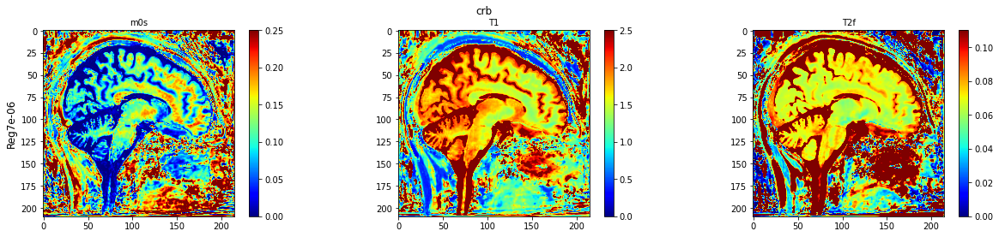

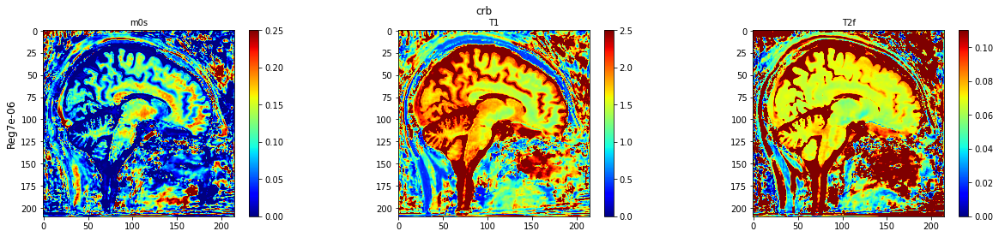

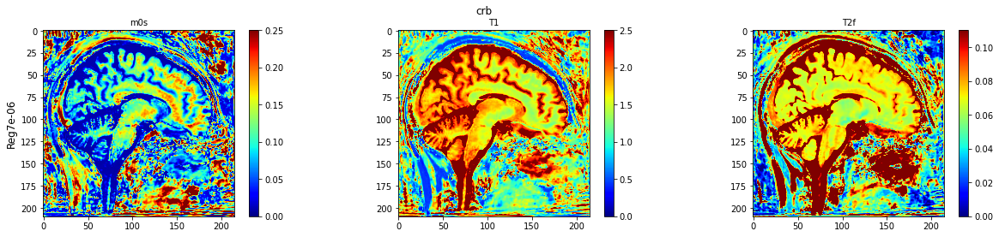

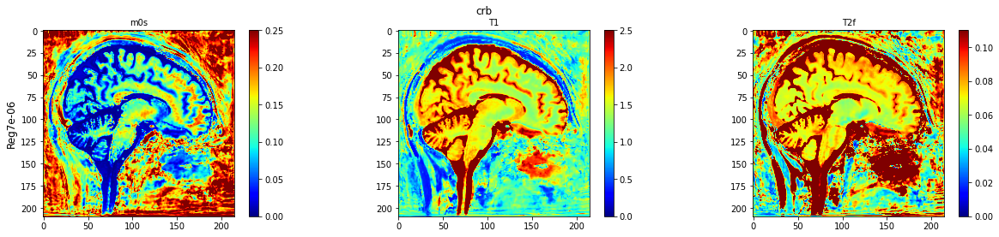

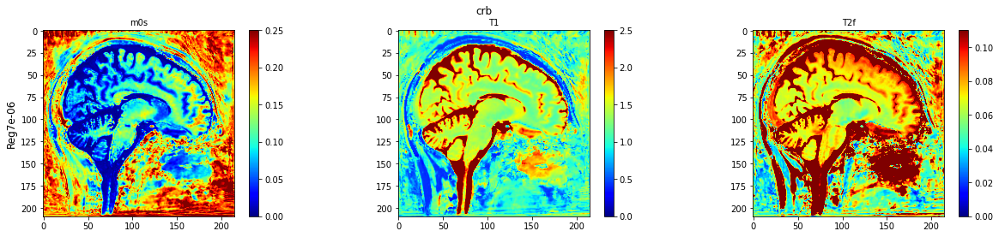

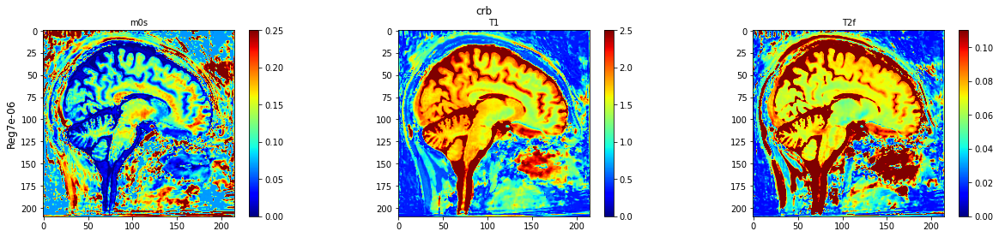

In [11]:
#select a slice to test
invivo_fingerprints=invivo_fingerprints_ori[:,93,:,:] #26, 175, 210
mrfshape = invivo_fingerprints.shape
invivo_fingerprints = invivo_fingerprints.reshape((-1, mrfshape[1] * mrfshape[2])) #26, 36750
invivo_fingerprints = invivo_fingerprints.T #36750, 26
for i in list1_good1:
    model_name = list1[i]
    invivo_result_slice =invivo_parameter_estimation_check(model,model_name, invivo_fingerprints)
    plot_invivo_slice_check(invivo_result_slice,'crb')

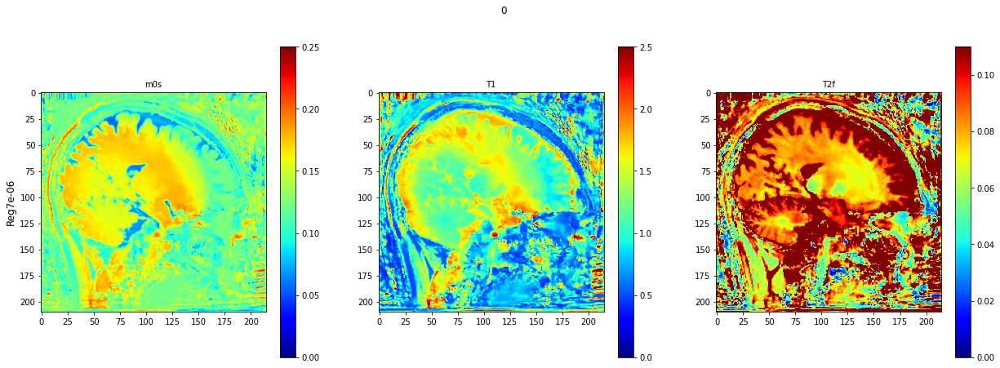

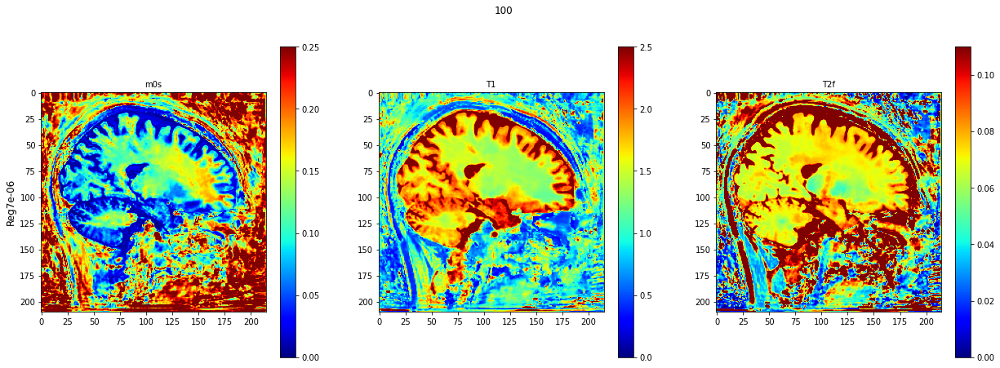

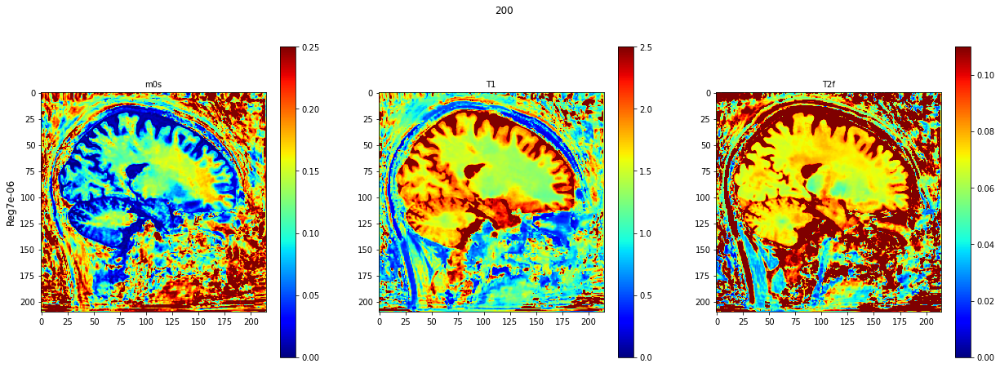

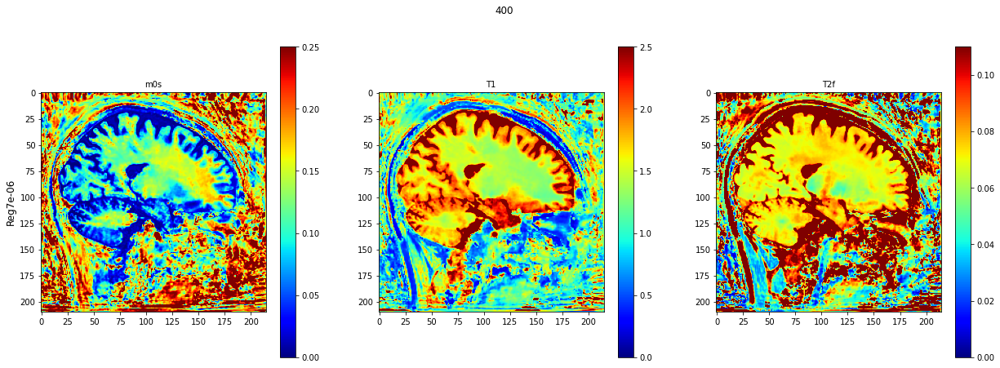

In [22]:
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')

model_name_base='d0428_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.01_noise0.01_PD1_1100file'

for i in [0,100,200,400]:
    model_name=model_name_base+str(i)
    title = str(i)

    invivo_result_slice =invivo_parameter_estimation_epochloop(model,model_name_base,model_name, invivo_fingerprints)
    plot_invivo_slice(invivo_result_slice,title)
    

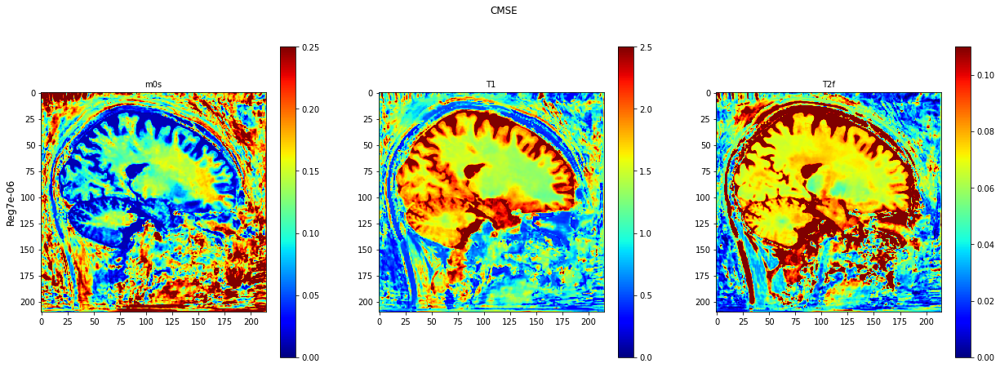

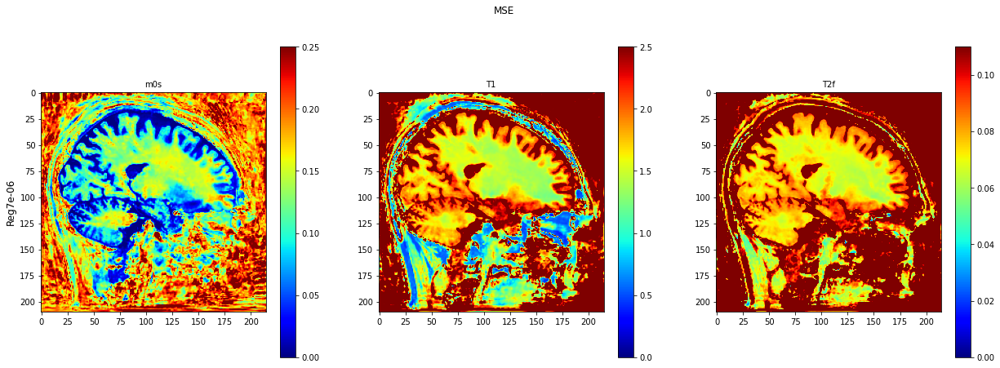

In [7]:
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')

model_name_list=['d0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise0.005_1000file',
                  'd0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001_noise_0.01',
                  'd0423_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001'] 
model_title_list=['1000file_noise0.005',
                    '590file_noise0.01',
                    '590file_noise0.005']
model_index=[0,1,2]
for i in model_index:
    model_name=model_name_list[i]
    invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
    plot_invivo_slice(invivo_result_slice,model_title_list[i])


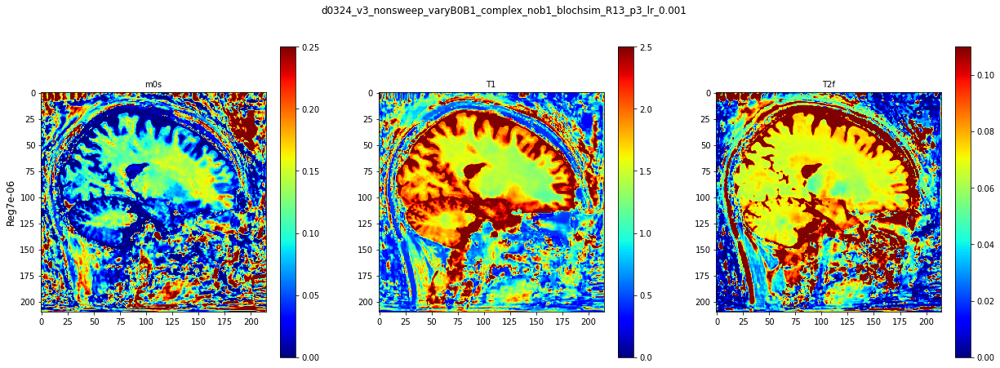

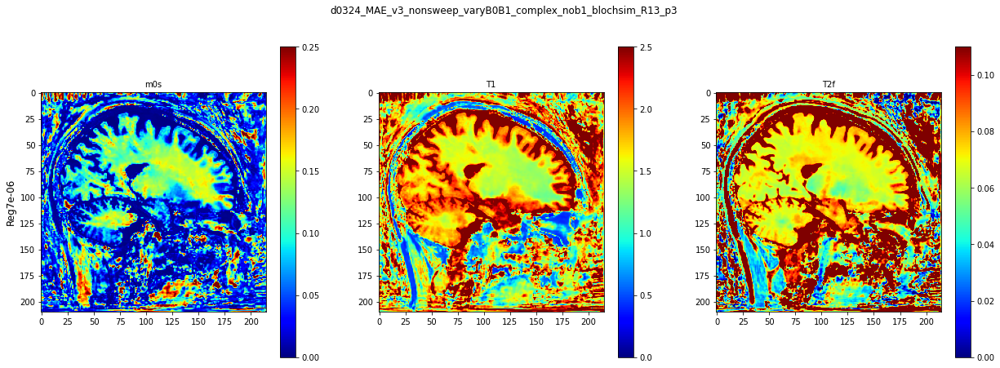

In [12]:
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')

model_list=['d0324_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001',
            'd0324_MSE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3',
            'd0324_MAE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3']
model_index=[0,2]
for i in model_index:
    model_name=model_list[i]
    invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
    plot_invivo_slice(invivo_result_slice)

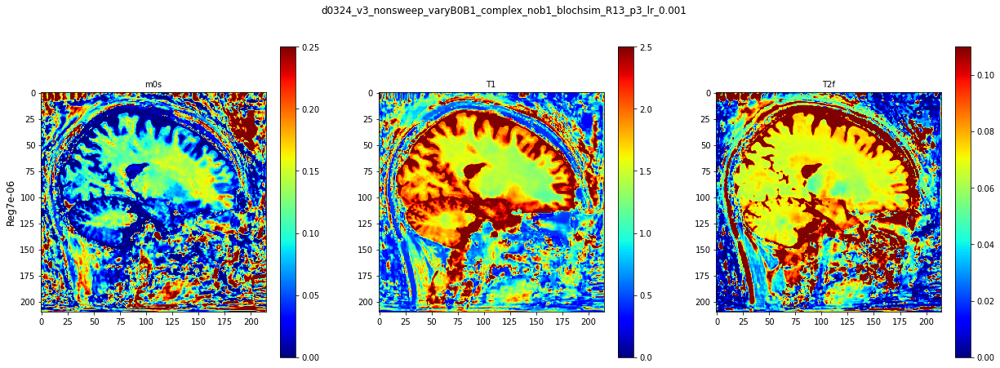

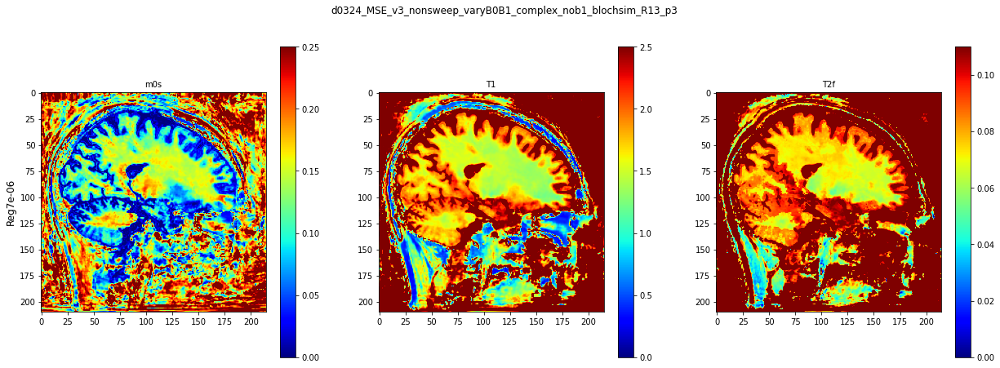

In [44]:
########################################### MSE/CRB invivo lr=0.01####################################################
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')

########## MSE/CRB invivo lr=0.001 #################
model_name ='d0324_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001'
invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
plot_invivo_slice(invivo_result_slice)

########## MSE invivo lr=0.001 #####################
model_name ='d0324_MSE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3'
invivo_result_slice =invivo_parameter_estimation(model,model_name, invivo_fingerprints)
plot_invivo_slice(invivo_result_slice)


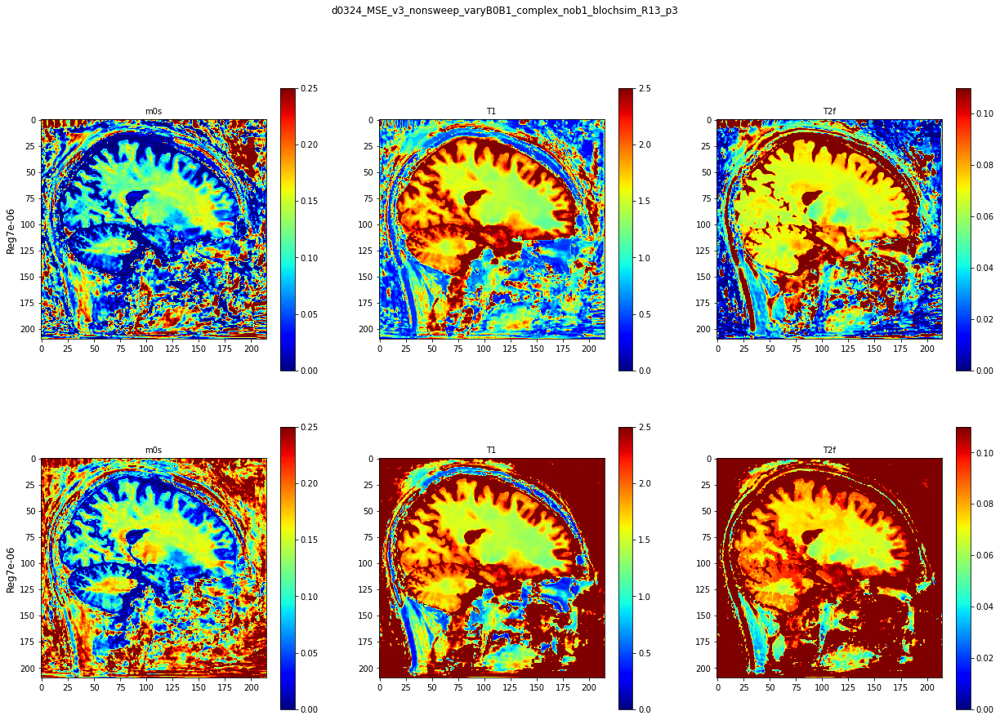

In [46]:
model = importlib.import_module('MRF.models.full_joint_deep3_blochsimv3p2_complexproj_0817_noprojection')


model_name_compare =['d0324_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3_lr_0.001',
                     'd0324_MSE_v3_nonsweep_varyB0B1_complex_nob1_blochsim_R13_p3']

########## MSE/CRB invivo lr=0.001 #################
data1 =invivo_parameter_estimation(model,model_name_compare[0], invivo_fingerprints)

########## MSE invivo lr=0.001 #####################
data2 =invivo_parameter_estimation(model,model_name_compare[1], invivo_fingerprints)

invivo=[data1,data2]
plot_invivo_2_slice_comparison(invivo,model_name_compare) 